## Particle Mesh on a Grid
## Mitchell Karmen, Christina Liu, and Carla Salguero

In [262]:
import numpy as np
import scipy as sp
from scipy import stats
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits import mplot3d
import matplotlib.colors
import math
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FixedLocator, FormatStrFormatter
import matplotlib, time
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation
from matplotlib.animation import FuncAnimation

Define all the functions used!

In [263]:
#truncate used in CIC to find which cell the particle belongs to
def truncate(n, decimals=0):
    multiplier = 10 ** decimals
    return int(n * multiplier) / multiplier

In [264]:
#determines color
def fn(var, x, y, row):
    return var[x][y][row]  

def plot_this(var, row, N):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    size = N # range 0 to 10
    # Make the 3D grid
    X, Y, Z = np.meshgrid(np.arange(0, size, 1),
                          np.arange(0, size, 1),
                          np.arange(0, size, 1))

    # calculate a colour for point(x,y,z)
    zs = np.array([fn(var, x, y, row) for x, y in zip(np.ravel(X), np.ravel(Y))])
    ZZ = zs.reshape(X.shape)  # this is used below

    # create the surface
    xx, yy = np.meshgrid(np.arange(0, size, 1), np.arange(0, size, 1))
    # Calcule the surface Z value, e.g. average of  the colours calculated above
    zzs = np.array([np.average(ZZ[x][y]) for x, y in zip(np.ravel(xx), np.ravel(yy))])
    zz= zzs.reshape(xx.shape)

    cube = ax.scatter(X, Y, Z, zdir='z', c=zs,alpha = 0.2, cmap=plt.cm.rainbow)
    surf = ax.plot_surface(xx, yy, zz, cmap=plt.cm.rainbow) 
    cbar = fig.colorbar(cube, shrink=0.6, aspect=5) # Add a color bar
    cbar.set_label('Density')

    plt.show()

In [265]:
#cloud in cell function to calculate the contribution of one particle to the neighboring
#particles (makes the density scalar grid)
def CIC(rho,particle,N):
    i = math.floor(particle[0]) #which cell
    j = math.floor(particle[1])
    k = math.floor(particle[2])
    center = np.array([i+ 0.5, j+0.5, k + 0.5]) #center of the cell
    x = truncate(particle[0])
    y = truncate(particle[1])
    z = truncate(particle[2])
    dx= abs(x-center[0])
    dy= abs(y-center[1])
    dz= abs(z-center[2])
    tx= abs(1-dx)
    ty= abs(1-dy)
    tz= abs(1-dz)
    rho[i][j][k] = rho[i][j][k] + (tx*ty*tz) #adds on density to each neighboring cell
    rho[i+1][j][k] = rho[i+1][j][k] + (dx*ty*tz)
    rho[i][j+1][k] = rho[i][j+1][k] + (tx*dy*tz)
    rho[i+1][j+1][k] = rho[i+1][j+1][k] + (dx*dy*tz)
    rho[i][j][k+1] = rho[i][j][k+1] + (tx*ty*dz)
    rho[i+1][j][k+1] = rho[i+1][j][k+1] + (dx*ty*dz)
    rho[i][j+1][k+1] = rho[i][j+1][k+1] + (tx*dy*dz)
    rho[i+1][j+1][k+1] = rho[i+1][j+1][k+1] + (dx*dy*dz)
    return rho

In [266]:
#delta grid
def make_delta(N):
    return np.array([int((N/2)+0.5), int((N/2)+0.5), int((N/2)+0.5)])

In [267]:
#density grid for delta 
def make_rho_d(position,N):
    rho= np.zeros([N,N,N])
    rho =CIC(rho,position,N)
    return rho

In [268]:
#density grid for gaussian
def make_rho(position,N):
    rho= np.zeros([N,N,N])
    for i in position:
        rho =CIC(rho,i,N)
    return rho/len(position)

In [269]:
#Obtains phi using inverse k^2 
def get_phi(rho, xyz, N):
    k = 2*np.pi*xyz/N
    return np.fft.ifftn(-4*np.pi*np.fft.fftn(rho)/np.sum(k*k))

In [270]:
#pads a grid by d on each dimension
def pad(rho, d):
    return np.pad(rho, pad_width = d, mode = 'constant', constant_values = 0)

In [271]:
#greens function (in spec)
def greens_func(r, L):
    if type(r) == list:
        r = np.array(r)
    if np.all(r ==0):
        return 1
    if np.all(abs(r) < L):
        return 1/(np.sum(r*r))
    else:
        return 0   

In [272]:
#create a grid for greens func for delta
def get_green_grid_d(positions, rho,N):
    green_grid = np.zeros([N,N,N])
    x,y,z = positions
    green_grid[int(x-(N/2))][int(y-(N/2))][int(z-(N/2))] = greens_func(positions, N)
    return green_grid

In [273]:
#create a grid for greens func gaussian
def get_green_grid(positions, rho,N):
    green_grid = np.zeros([N,N,N])
    for i in positions:
        r = np.array([i[0],i[1],i[2]])
        green_grid[int(truncate(i[0])-(N/2) -0.5)][int(truncate(i[1])-(N/2) -0.5)][int(truncate(i[2])-(N/2) -0.5)] = greens_func(r, N)
    return green_grid

In [274]:
#get phi using green's theorem
def get_greenphi(rho, green_grid):
    
    phi = np.fft.ifftn(-4*np.pi*np.fft.fftn(rho)*np.fft.fftn(green_grid))
#     phi[0:2][:][:] = np.zeros((2, len(green_grid), len(green_grid)))
#     phi[:][0:2][:] = np.zeros((2, len(green_grid), len(green_grid)))
#     phi[:][:][0:2] = np.zeros((2, len(green_grid), len(green_grid)))
#     phi[len(green_grid)-2:][:][:] = np.zeros((2, len(green_grid), len(green_grid)))
#     phi[:][len(green_grid)-2:][:] = np.zeros((2, len(green_grid), len(green_grid)))
#     phi[:][:][len(green_grid)-2:] = np.zeros((2, len(green_grid), len(green_grid)))
    
    return phi

Testing on delta function

In [275]:
N=32 #global variable
delta = make_delta(N)
rho_d = make_rho_d(delta, N)
phi_d = get_phi(rho_d, delta, N).real

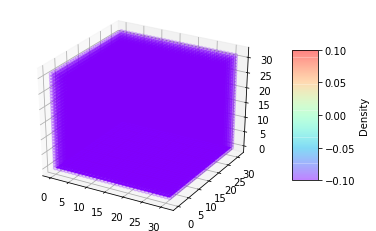

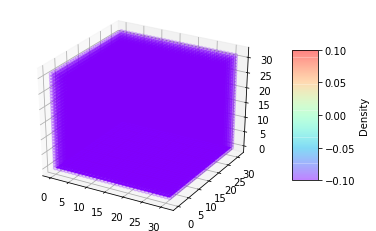

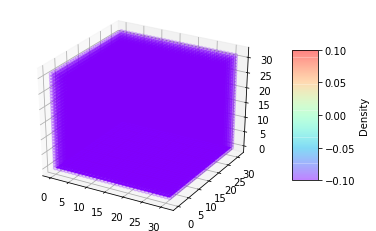

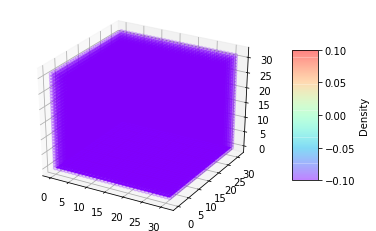

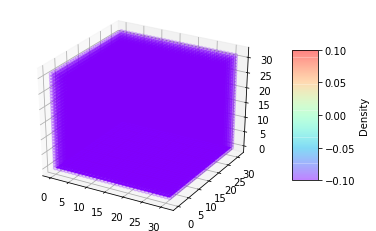

...

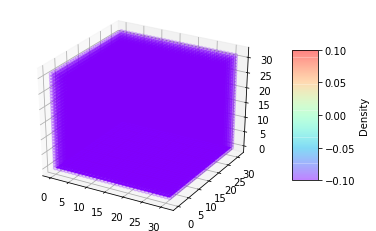

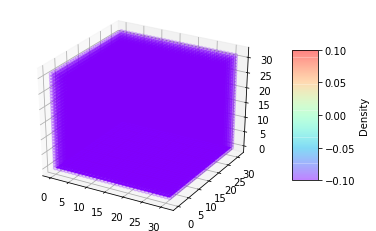

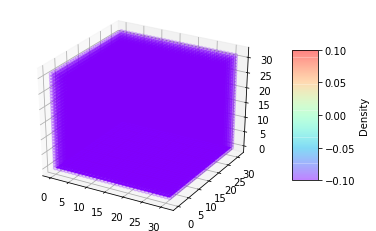

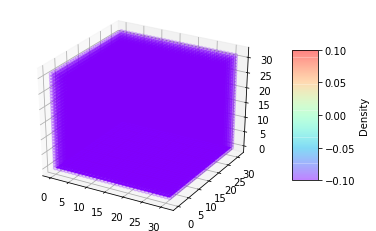

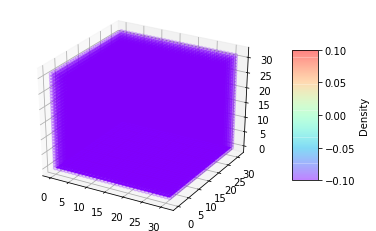

In [276]:
for i in range(N):
    plot_this(rho_d,i, N) #looks like a delta density distribution!

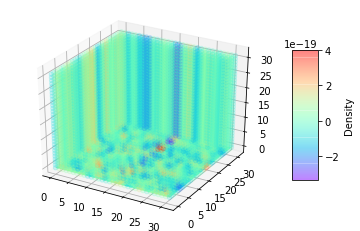

In [277]:
%matplotlib inline
plot_this(phi_d, 6, N)

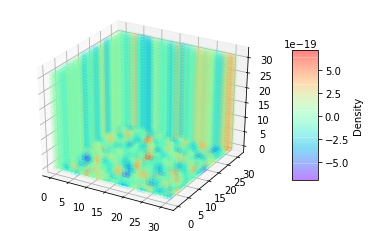

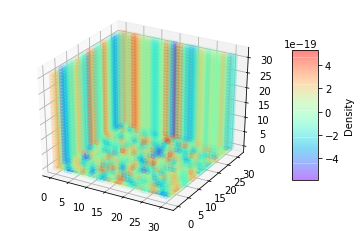

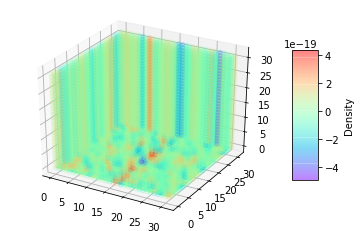

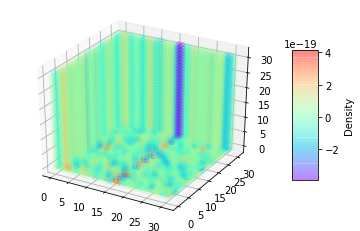

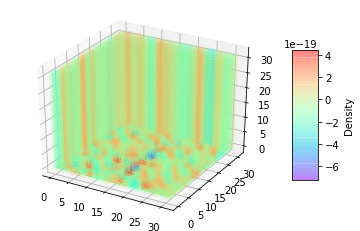

...

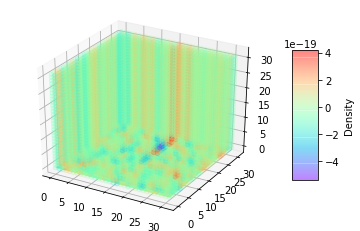

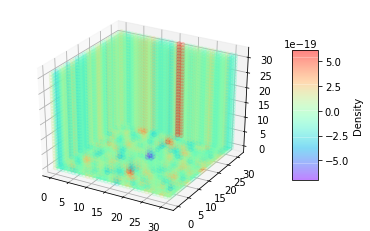

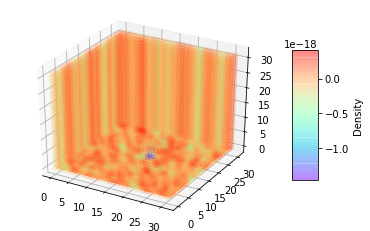

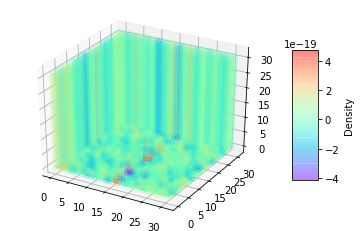

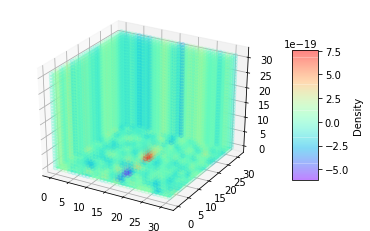

In [278]:
for i in range(N):
    plot_this(phi_d,i, N) #delta looks weird?

In [279]:
green_grid_d = get_green_grid_d(delta,rho_d,N+4)
padded_rho_d = pad(rho_d,2)
greenphi_d= get_greenphi(padded_rho_d, green_grid_d).real

In [280]:
%matplotlib inline

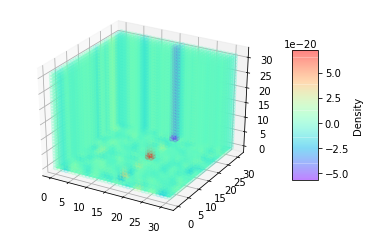

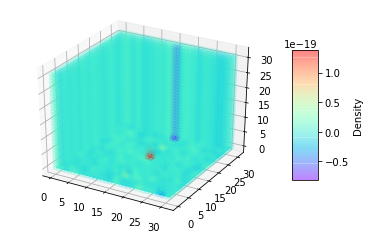

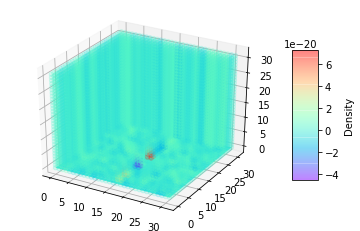

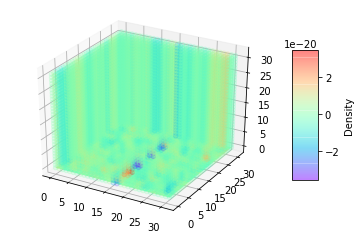

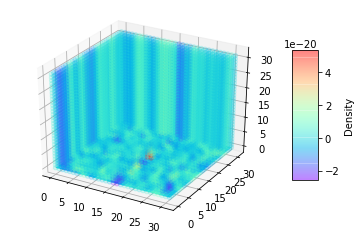

...

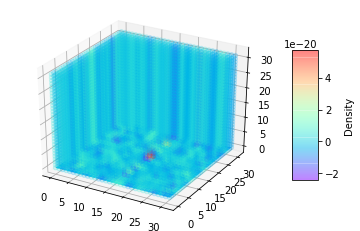

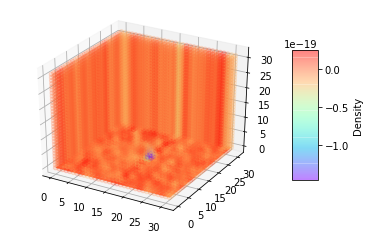

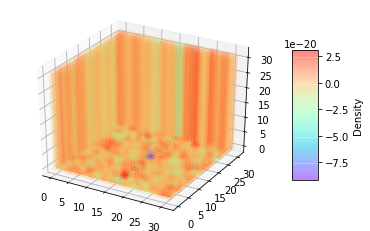

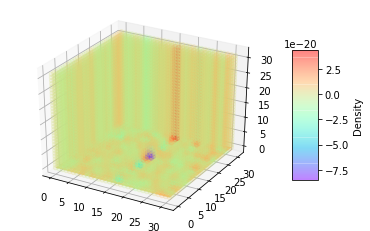

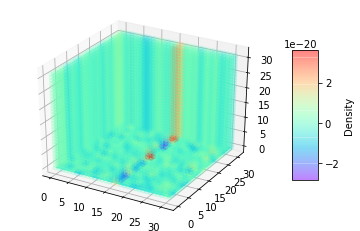

In [281]:
for i in range(N):
    plot_this(greenphi_d,i, N) #better delta! 

Let's look at Gaussian distributions instead of delta!

In [282]:
def random(mu,sigma, N):
     return np.random.normal(mu, sigma, [(N)**3, 3])
xyz = random(8,1, N)
rho_1=make_rho(xyz,N)

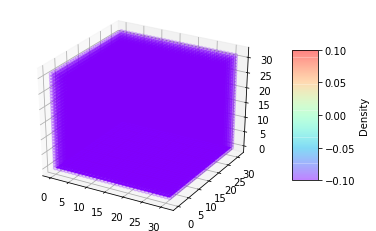

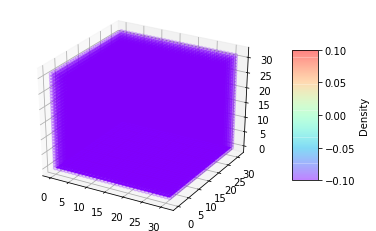

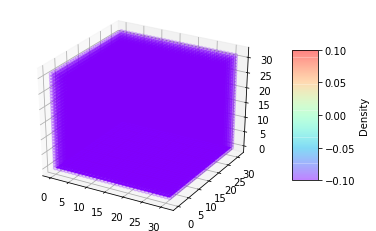

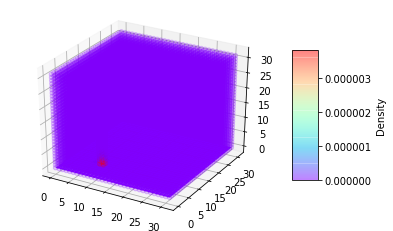

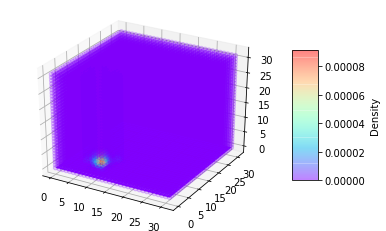

...

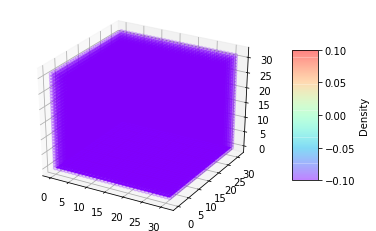

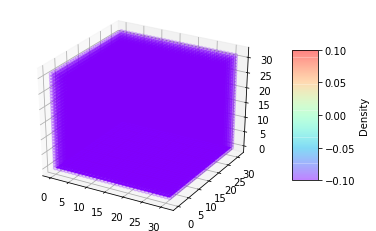

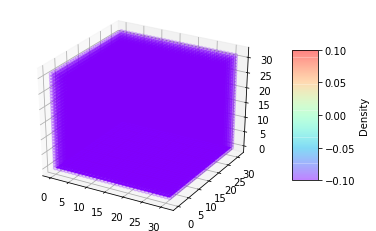

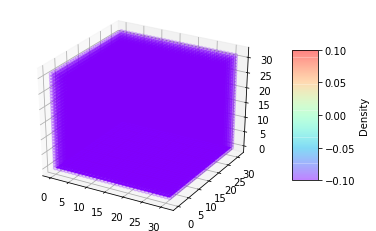

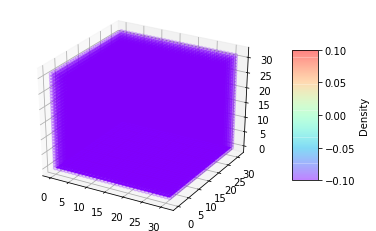

In [283]:
for i in range(N): 
    plot_this(rho_1,i,N) #gaussian distrubted particles! 

In [284]:
phi_1 = get_phi(rho_1, xyz, N).real

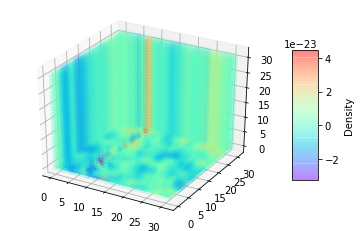

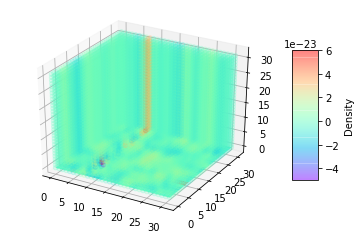

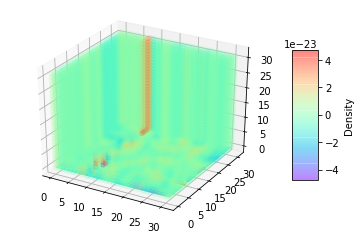

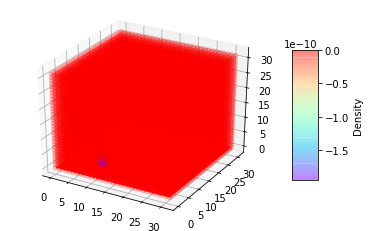

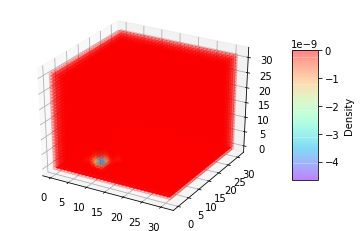

...

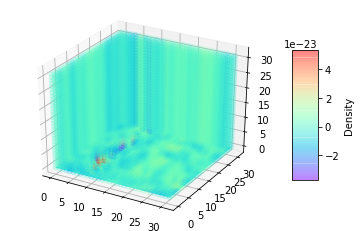

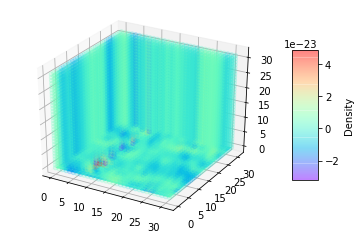

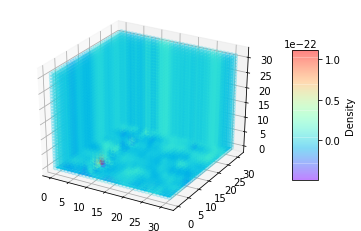

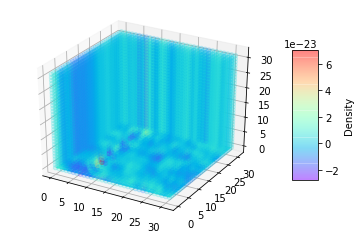

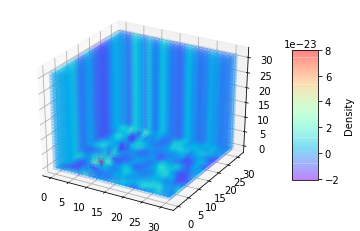

In [285]:
for i in range(N):
    plot_this(phi_1,i,N) #we can get a better phi

In [286]:
green_grid_1 = get_green_grid(xyz, rho_1,N+4)
padded_rho_1 = pad(rho_1,2)

In [287]:
greenphi_1= get_greenphi(padded_rho_1, green_grid_1).real

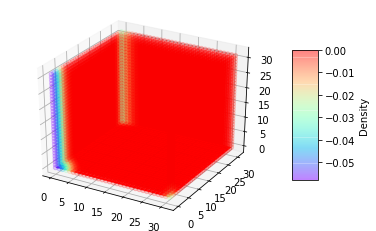

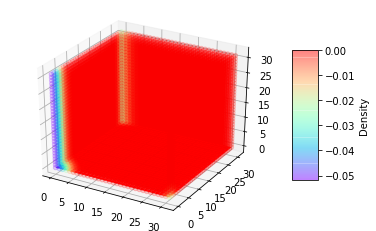

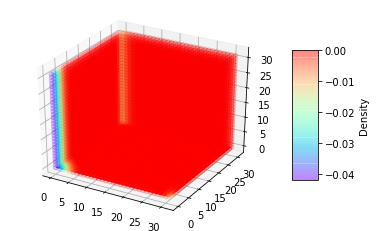

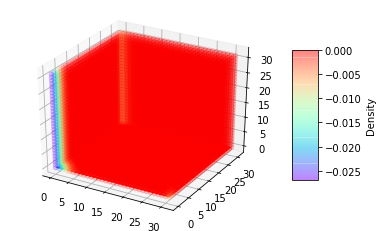

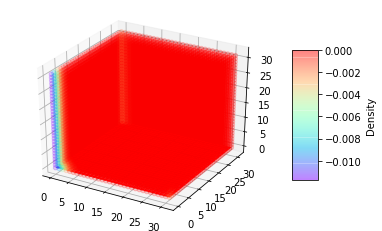

...

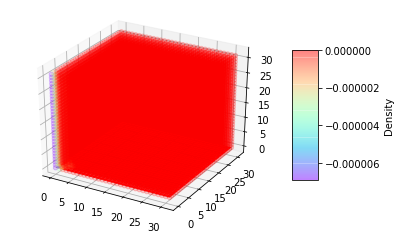

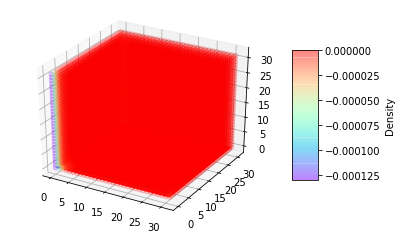

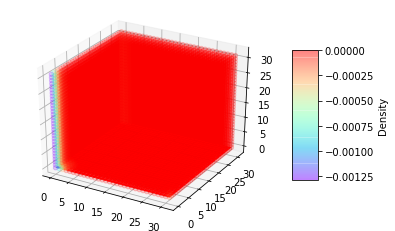

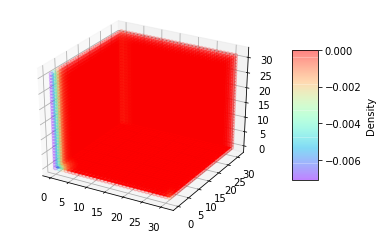

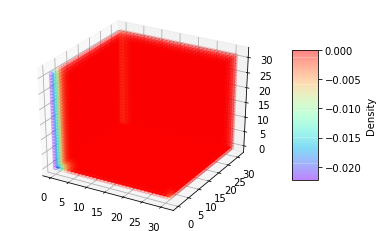

In [288]:
for i in range(N):
    plot_this(greenphi_1,i,N)

In [289]:
xyz_2 = random(6,2,N) #trying different ratios
rho_2 = make_rho(xyz_2,N)
green_grid_2 = get_green_grid(xyz_2,rho_2,N+4)
padded_rho_2 = pad(rho_2,2)
greenphi_2= get_greenphi(padded_rho_2, green_grid_2).real

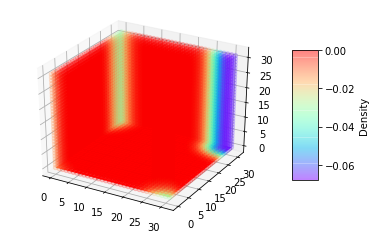

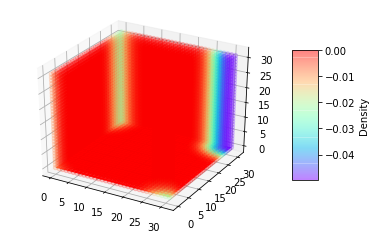

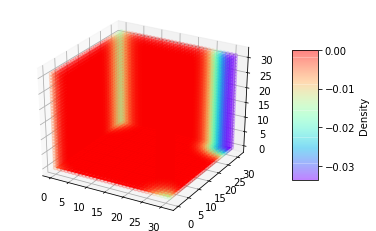

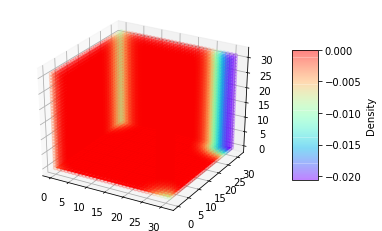

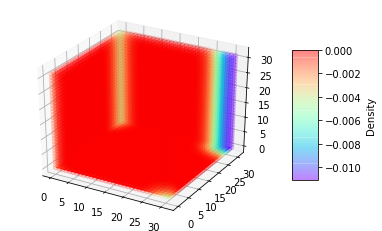

...

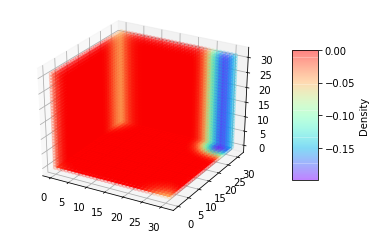

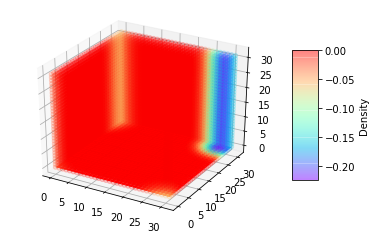

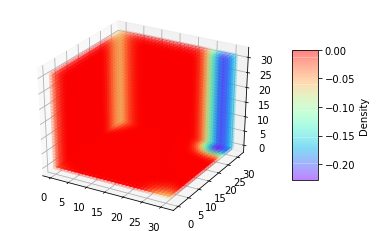

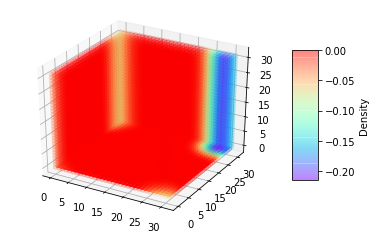

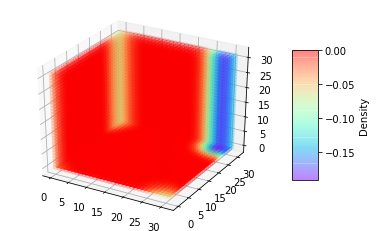

In [290]:
for i in range(N):
    plot_this(greenphi_2,i,N)

In [291]:
xyz_3 = random(8,2/3,N) #get's narrower
rho_3 = make_rho(xyz_3,N)
green_grid_3 = get_green_grid(xyz_3,rho_3,N+4)
padded_rho_3 = pad(rho_3,2)
greenphi_3= get_greenphi(padded_rho_3, green_grid_3).real

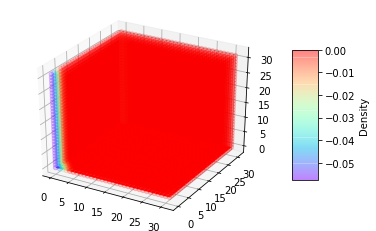

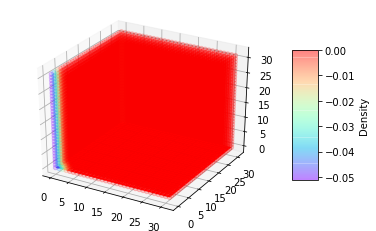

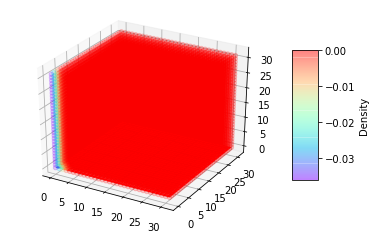

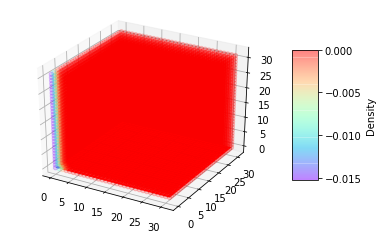

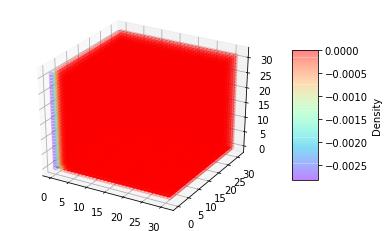

...

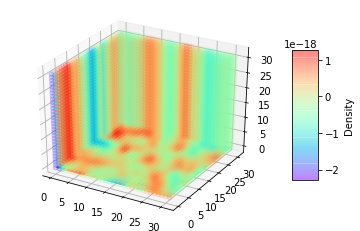

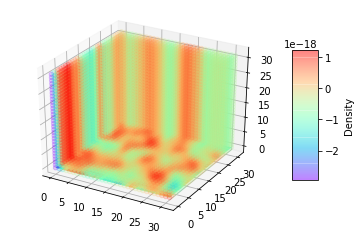

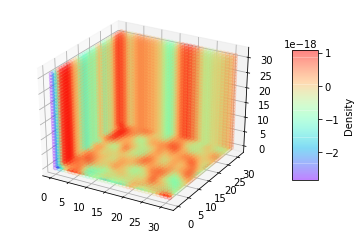

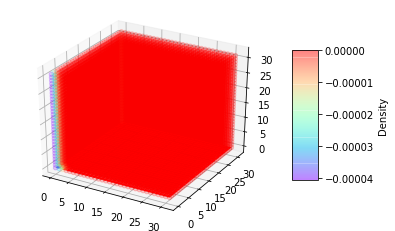

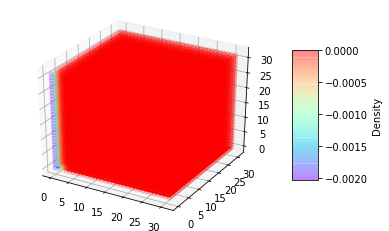

In [292]:
for i in range(N):
    plot_this(greenphi_3,i,N)

Integrating the equations!

In [293]:
def integrate(x, v0, dt):
    step = 0
    nsteps = len(x)
    while step < nsteps-1:
        com = COM(x[step])
        x[step] = np.array([p - (com - 8) for p in x[step]]) #change 8 to N/2+ or something
        for i in range(len(x[step])):
            if (x[step, i] > N-2).any() or (x[step, i] < 1).any():
                x[step-1, i] = np.array([8, 8, 8])
                x[step, i] = np.array([8, 8, 8])
        #print(np.amax(x[step]), np.amin(x[step]))
        f = calculate_force(x[step])
        t[step] = dt*step
        if step > 0:
            x[step+1] = update(f, x[step], x[step-1], dt)
        elif step == 0:
            x[1] = x[0] + v0*dt + 0.5*forcelist(f, x[0])*dt*dt
        #print('2', x[step])
        step = step + 1
    return x

In [294]:
def calculate_force(xyz):
    N = 16
    rho = np.zeros([N,N,N])
    for i in xyz:
        rho = CIC(rho,i,N)
    greens = get_green_grid(xyz, rho,N+4)
    padded_rho = np.pad(rho, pad_width = 2, mode = 'constant', constant_values = 0)
    
    phi= get_greenphi(padded_rho, greens).real
    f = np.array(np.gradient(phi))
    return -1*f

In [295]:
def update(f, x, x_minus_one, dt):
    return 2*x - x_minus_one + forcelist(f, x)*dt*dt

In [296]:
def forcelist(forcecube, xyz):
    f = np.zeros(xyz.shape)
    for i in range(len(xyz)):
        f[i] = np.array([forcecube[0][int(xyz[i][0])][int(xyz[i][1])][int(xyz[i][2])], forcecube[1][int(xyz[i][0])][int(xyz[i][1])][int(xyz[i][2])], forcecube[2][int(xyz[i][0])][int(xyz[i][1])][int(xyz[i][2])]])
    return f

In [297]:
def COM(positions):
    #print(positions[:, 0])
    xcom = np.sum(positions[:, 0])/len(positions)
    ycom = np.sum(positions[:, 1])/len(positions)
    zcom = np.sum(positions[:, 2])/len(positions)
    return np.array([xcom, ycom, zcom])

In [309]:
N = 4
nsteps = 800
xoft = np.zeros([nsteps, N**3, 3])
v0 = np.zeros([N**3, 3])
xoft[0] = random(8, 0.25, N)
t = np.zeros(nsteps)

In [310]:
xs = integrate(xoft, v0, 0.01)

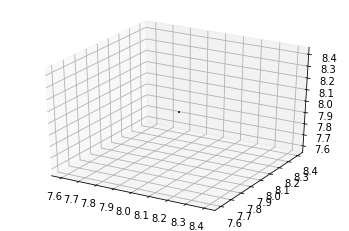

In [311]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter([x[0] for x in xs[0]], [x[1] for x in xs[0]], [x[2] for x in xs[0]], marker = '.', s = 2, c = 'purple', alpha = 0.4)

In [312]:
def update_this(i):
    plt.cla()
    graph = ax.scatter([x[0] for x in xs[i]], [x[1] for x in xs[i]], [x[2] for x in xs[i]], marker = '.', s = 2, c = 'purple', alpha = 0.4)
    ax.set_xlim([0, 16])
    ax.set_ylim([0, 16])
    ax.set_zlim([0, 16])
    return graph

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


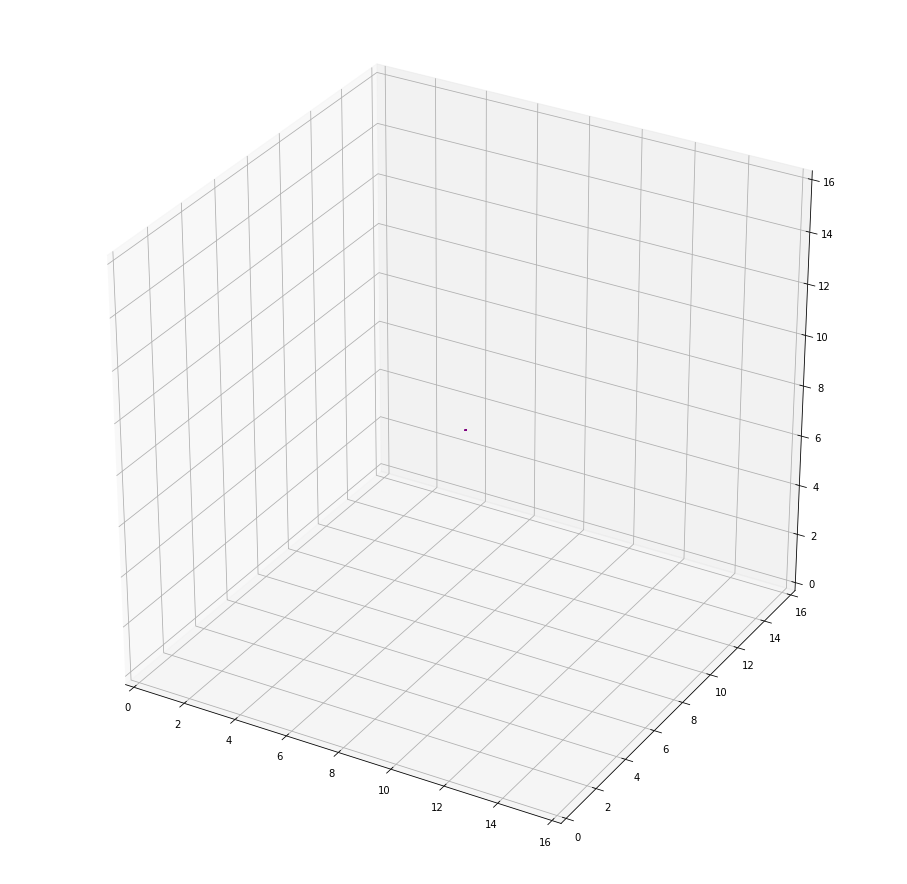

In [313]:
fig = plt.figure(figsize = (16, 16))
ax = fig.add_subplot(111, projection='3d')

graph = ax.scatter([x[0] for x in xs[0]], [x[1] for x in xs[0]], [x[2] for x in xs[0]])
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title(r'$N=16^{3}$')
line_ani = FuncAnimation(fig, update_this, nsteps, 
                               interval=100, blit=False)
line_ani.save('Test1.gif', dpi=140, writer='imagemagick')
